# PANSHARPENING

## Panchromatic Refinement: A Strategy for Increasing Resolution in Hyperspectral Satellite Imagery

By: 

PhD(c) Steven Martinez Vargas

mail: smarvar@outlook.com

This notebook contains all the functionalities to apply the pansharpening technique to hyperspectral or multispectral images from a high resolution panchromatic image.  The next pansharpening techniques were implemented:   
- PCA pansharpenig
- Brovey Transform

Both methods allow the spatial resolution of the hyperspectral/multispectral images to be increased to the resolution of the associated panchromatic image. 

Different metrics were implemented to evaluate the quality of the panchromatic fusion obtained by both methods. These metrics include spatial correlation index (Q), spectral correlation index (SCC), mean squared error (MSE), signal to noise ratio (SNR). 

Different visual comparisons were generated, based on the corresponding images and histograms of the hyperspectral set and the results of the pansharpening methods. 


## Notebook contents:

- Hyperspectral data
- Preprocesing 
- Pansharpening methods: PCA, Brovey
- Visual comparison
- Validation metrics
- Histogram comparison

## Libraries

All implemented functionalities are contained in the associated hypertools, pansharpening and hypermetrics libraries. 

In [1]:
import numpy as np
import hypertools as hyp
import pansharpening as ps
import hypermetrics 

## Hyperspectral data (HSI)

Hyperspectral images from the PRISMA satellite were used in this study. To access the PRISMA data you can visit the following link:  https://prismauserregistration.asi.it/

Once you download the PRISMA hyperspectral image you will have an HDF5 file, the hyp.open_pansharpened_file function allows you to access the information in the file.  

Note: if you already have the hyperspectral or multispectral data with the panchromatic image from another satellite, you must view the data format and generate a hyper[i,j,n] matrix where n corresponds to the spectral bands.  In addition, a PANCHRO[I,J] matrix corresponding to the panchromatic image must be generated. Once this is done, you can move on to the preprocessing step. 

### Study area

The study area corresponds to the coasts of the municipality of Punta Alta, northeast of the Bahía Blanca estuary, province of Buenos Aires, Argentina.

In [2]:
# Prisma data path
HSI_directory = 'PRS_L1_STD_OFFL_20231115141106_20231115141110_0001/PRS_L1_STD_OFFL_20231115141106_20231115141110_0001.he5'
file = hyp.open_pansharpened_file(root_file = HSI_directory)

Elements in file: ['HDFEOS', 'HDFEOS INFORMATION', 'Info', 'KDP_AUX']


### Access to Hyperspectral data

In [3]:
# VNIR array selection within prism hyperspectral data
HYPER = file['HDFEOS']['SWATHS']['PRS_L1_HCO']['Data Fields']['VNIR_Cube']
HYPER = np.array((HYPER))
HYPER = np.transpose(HYPER, (0, 2, 1))
print("Shape: {} and Type: {}".format(HYPER.shape, HYPER.dtype))

Shape: (1000, 1000, 66) and Type: uint16


#### Search for null bands through SNR

In [4]:
# Calcualte SNR for all bands
snr, pos = hyp.snr_finding_null_values(HYPER, 0)
# Eliminate bands with SNR < 0
hyper = hyp.remove_bands(HYPER, pos)
print('Hyper Shape before: {}, after: {}'.format(HYPER.shape, hyper.shape))

Total null bands found: 3, Null band number: [0 1 2]
Hyper Shape before: (1000, 1000, 66), after: (1000, 1000, 63)


### Visualization of a spectral band

Shape: (1000, 1000) and Type: uint16
Pixel range: [721, 21547]


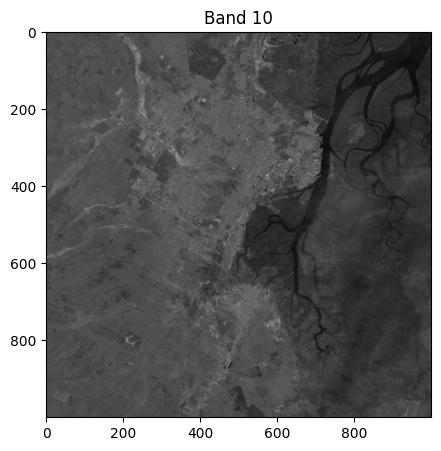

In [5]:
# Select a band between range [0, 63]
band = 10
hyp.info_graph(hyper[:,:,band], 'Band {}'.format(band))

### Access to Panchromatic image

Shape: (6000, 6000) and Type: uint16
Pixel range: [94, 1771]


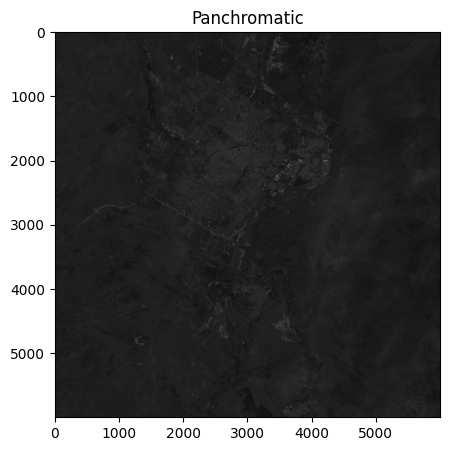

In [6]:
PANCHRO = file['HDFEOS']['SWATHS']['PRS_L1_PCO']['Data Fields']['Cube']
PANCHRO = np.array((PANCHRO))
hyp.info_graph(PANCHRO, 'Panchromatic')

### Visualization of hyperspectral(bands) and panchromatic histograms

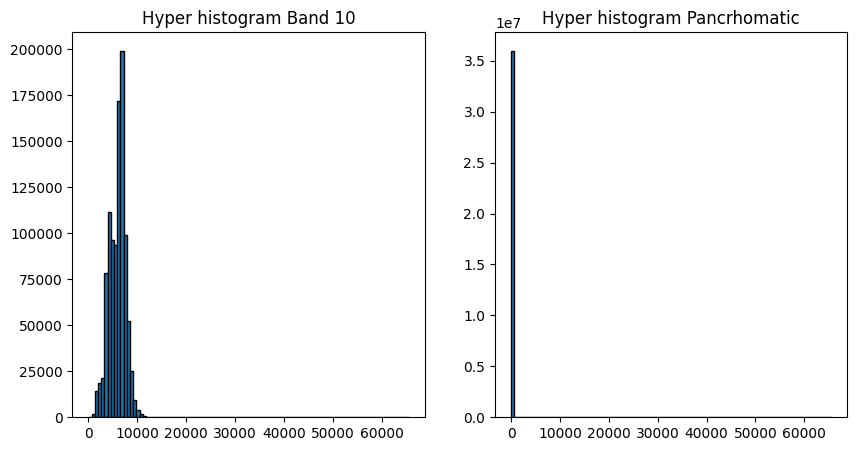

In [7]:
hyp.hyper_histogram(hyp_1=hyper[:,:,band], hyp_2=PANCHRO, n_bins=100, title_1='Band {}'.format(band), title_2='Pancrhomatic')

## Preprocessing

### Reescaling

Before running the pansharpening algorithms, it is necessary to rescale the set of hyperspectral bands to the dimensions of the panchromatic image.

In [9]:
# Decompose if it is the first execution
#_ = hyp.rescaling(PANCHRO, hyper, save = True)

In [7]:
# Open hyper_up file
hyper_up = hyp.open_pansharpened_file(root_file ='hyper_up.h5')
hyper_up = hyper_up['hyper_up']
hyper_up = np.array((hyper_up))
print("Shape: {} and Type: {}".format(hyper_up.shape, hyper_up.dtype))

Elements in file: ['hyper_up']
Shape: (6000, 6000, 63) and Type: uint16


Image Before: Shape (1000, 1000, 63) and Type uint16
Image After: Shape (6000, 6000, 63) and Type uint16
Minimum pixel value: Before 721, After 721
Maximum pixel value: Before 21547, After  21547


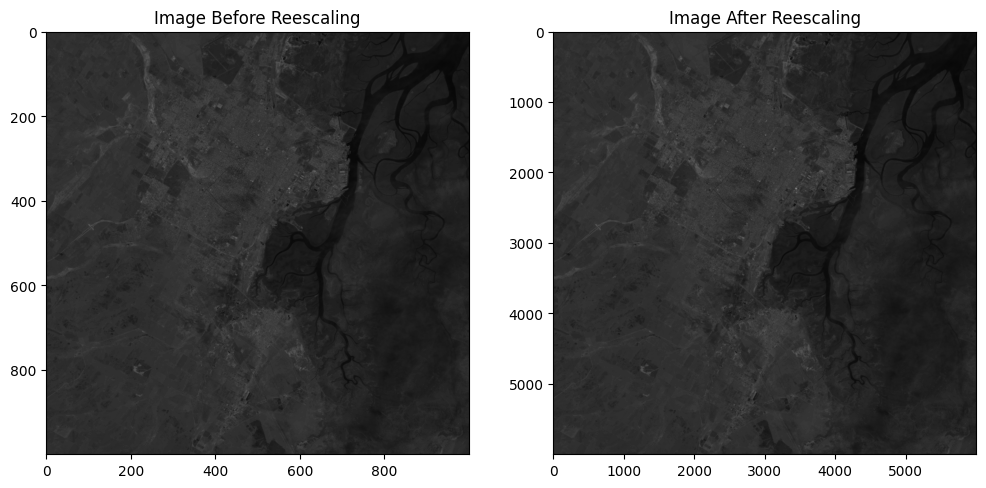

In [11]:
hyp.compare_modified_imgs(im_before=hyper, im_after=hyper_up, band=band, title_im_modified='Reescaling')

## Pansharpening methods: PCA, Brovey

### PCA pansharpening

In [ ]:
# Uncomment to obtain PCA pansharpening
#PCA_pansharpened = ps.pca_pansharpening(hyper=hyper_up, panchro=PANCHRO, name_file_to_save='PCA_pansharpening2.h5')

In [8]:
# Open PCA pansharpened data
PCA_pansharpened = hyp.open_pansharpened_file(root_file ='PCA_pansharpening.h5')
PCA_pansharpened = PCA_pansharpened['PCA_pansharpening']
PCA_pansharpened = np.array(PCA_pansharpened)

Elements in file: ['PCA_pansharpening']


#### Results: Hyperespectral PRISMA vs PCA Pansharpened

Image Before: Shape (1000, 1000, 63) and Type uint16
Image After: Shape (6000, 6000, 63) and Type uint16
Minimum pixel value: Before 721, After 0
Maximum pixel value: Before 21547, After  62611


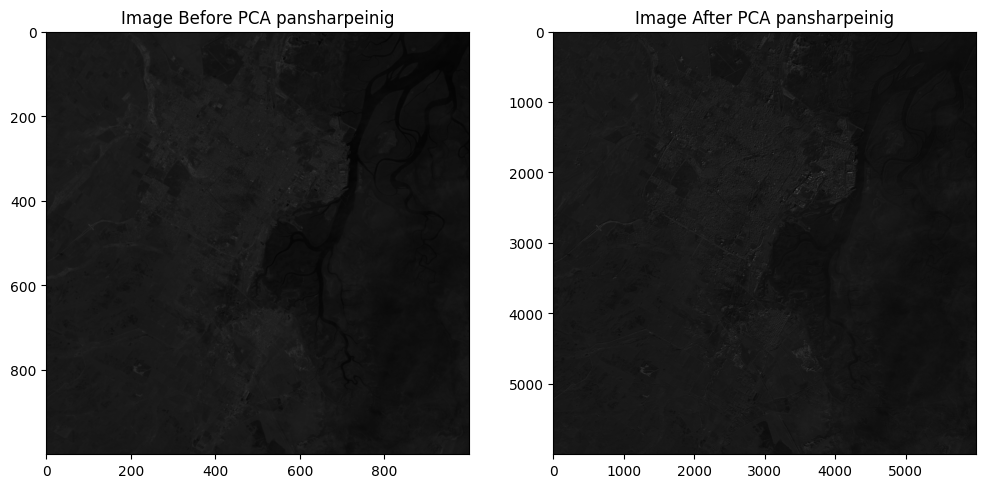

In [11]:
# Before and After PCA pansharpening
hyp.compare_modified_imgs(im_before=hyper, im_after=PCA_pansharpened, 
                          band=band, title_im_modified='PCA pansharpeinig')

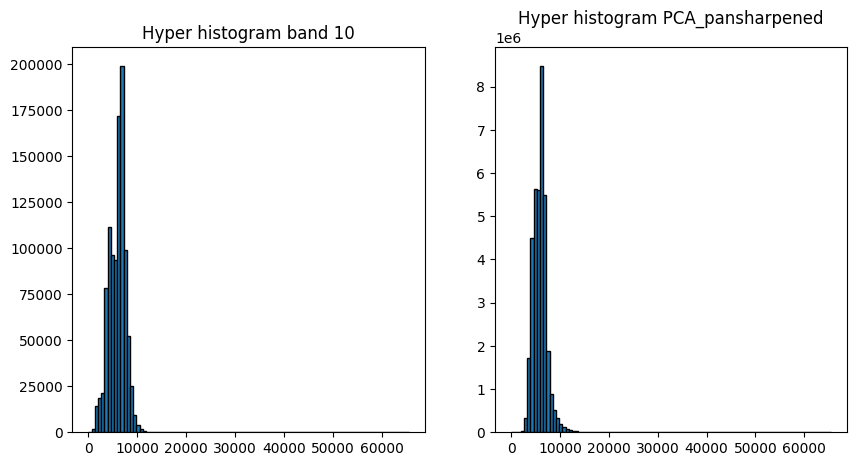

In [10]:
# Before and After PCA pansharpening
hyp.hyper_histogram(hyp_1=hyper[:,:,band], hyp_2=PCA_pansharpened[:,:,band], 
                    n_bins=100, title_1='band {}'.format(band), title_2='PCA_pansharpened')

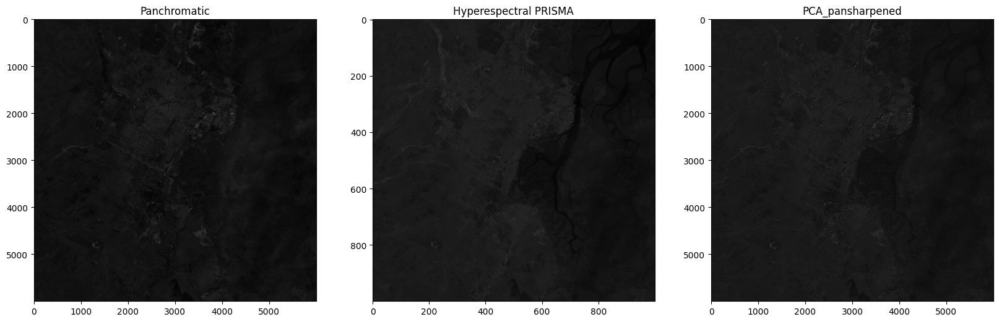

In [9]:
# Comparison between Panchromatic, hyperspectral PRISMA and PCA_pansharpened
hyp.triple_graph(PANCHRO, hyper[:,:,band], PCA_pansharpened[:,:,band], 
                 'Panchromatic', 'Hyperespectral PRISMA','PCA_pansharpened')

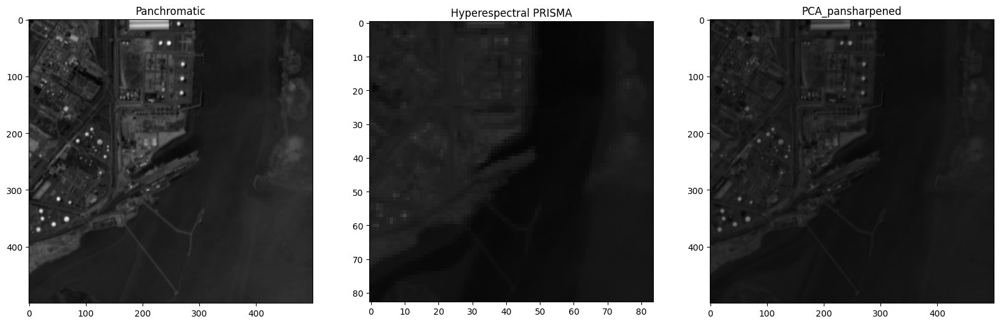

In [16]:
# Comparison between Panchromatic, Hyperspectral PRISMA and PCA_pansharpened, zoomed to an area of 500 x 500 pixels.
coord_x = 4000
coord_y = 2000
n_pixels = 500
band = 10
hyp.triple_zoom_graph(hyp_0=PANCHRO, hyp_1=hyper[:,:,band], hyp_2=PCA_pansharpened[:,:,band], 
                      cx=coord_x, cy=coord_y, npixels=n_pixels, 
                      title_0='Panchromatic', title_1='Hyperespectral PRISMA',title_2='PCA_pansharpened')

##### Comparison between Panchromatic, Hyperspectral reescaled and PCA_pansharpened, zoomed to an area of 500 x 500 pixels.

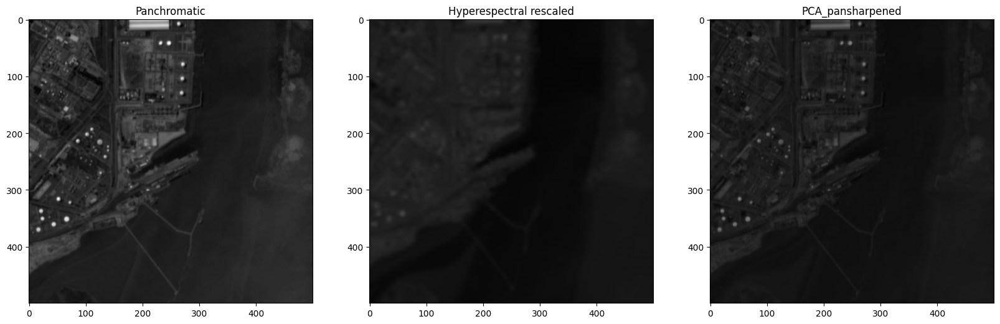

In [17]:
# Comparison between Panchromatic, Hyperspectral reescaled and PCA_pansharpened, zoomed to an area of 500 x 500 pixels.
coord_x = 4000
coord_y = 2000
n_pixels = 500
band = 10
hyp.triple_zoom_graph(hyp_0=PANCHRO, hyp_1=hyper_up[:,:,band], hyp_2=PCA_pansharpened[:,:,band], 
                      cx=coord_x, cy=coord_y, npixels=n_pixels, 
                      title_0='Panchromatic', title_1='Hyperespectral rescaled',title_2='PCA_pansharpened')

Band 0


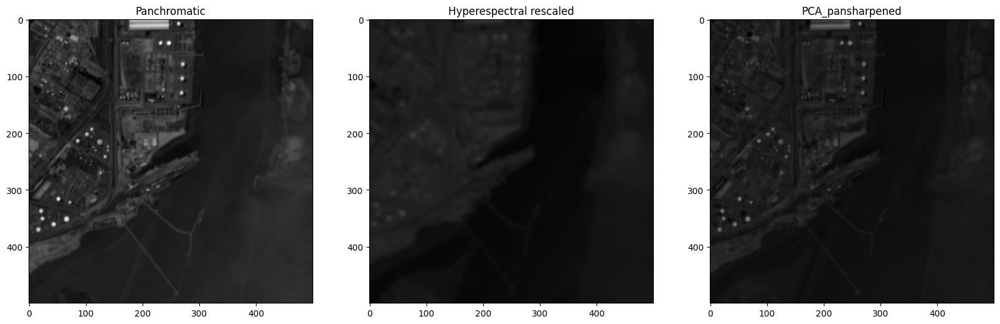

Band 10


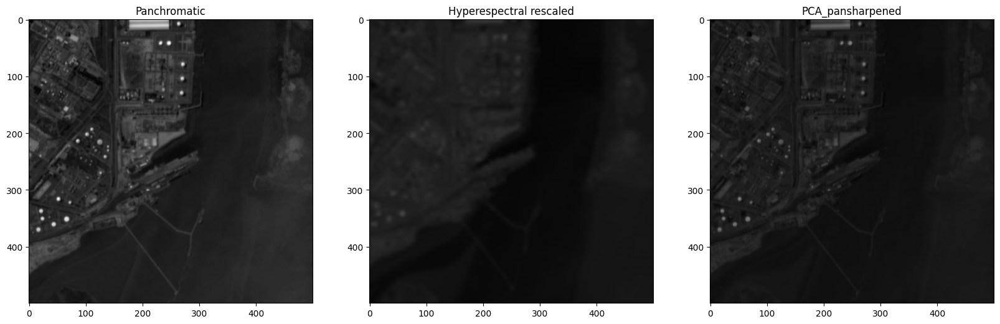

Band 20


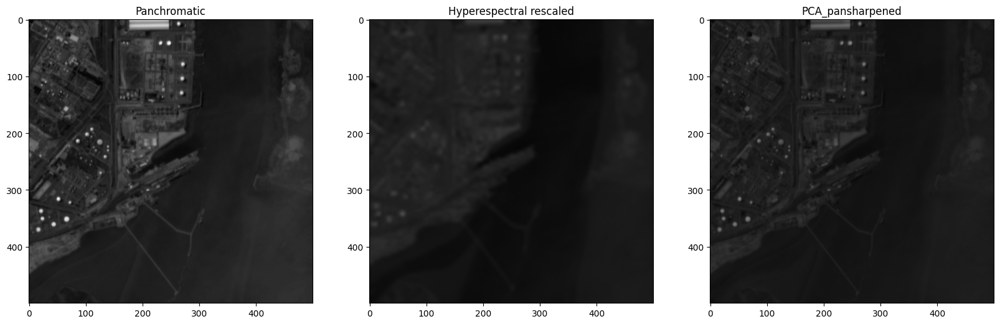

Band 30


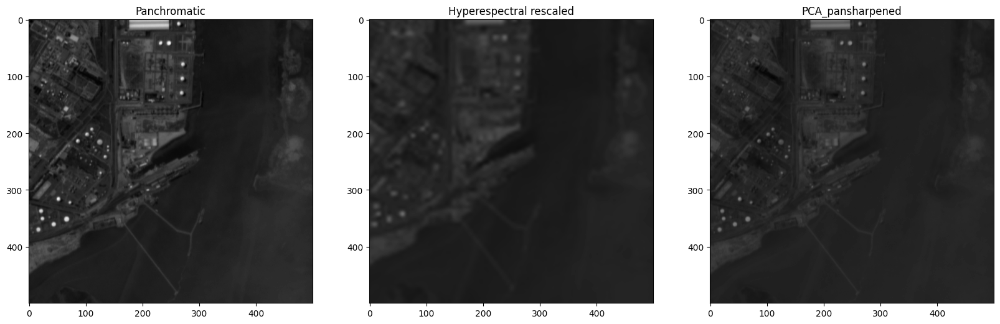

Band 40


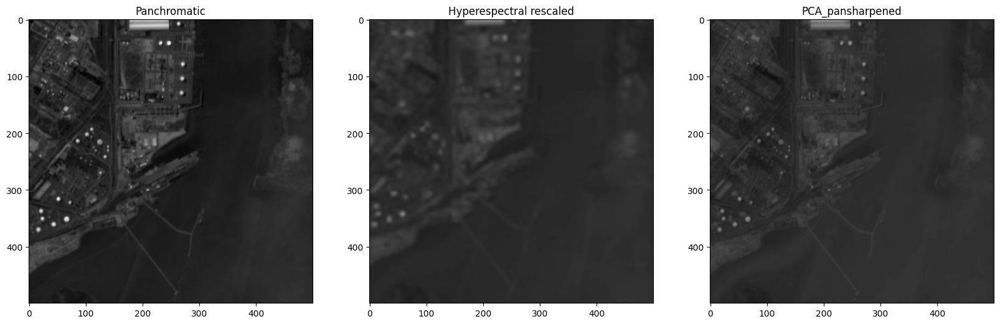

Band 50


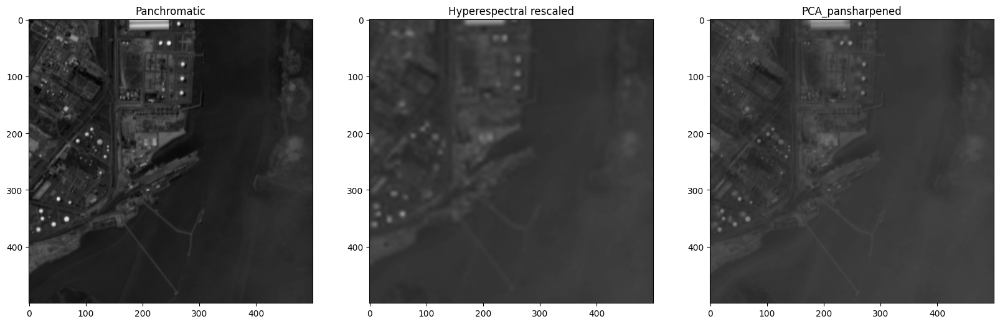

In [12]:
# Comparing several bands
band_list = range(0, 60, 10)
for n_band in band_list:
    print('Band {}'.format(n_band))
    hyp.triple_zoom_graph(hyp_0=PANCHRO, hyp_1=hyper_up[:,:,n_band], hyp_2=PCA_pansharpened[:,:,n_band], 
                      cx=4000, cy=2000, npixels=500, 
                      title_0='Panchromatic', title_1='Hyperespectral rescaled',title_2='PCA_pansharpened')

### Brovey pansharpening

In [14]:
# Uncomment to obtain Brovey pansharpening
# Brovey_pansharpened = ps.brovey_pansharpening(hyper_up, PANCHRO)

In [15]:
Brovey_pansharpened = hyp.open_pansharpened_file(root_file ='brovey_pansharpening.h5')
Brovey_pansharpened = Brovey_pansharpened['brovey_pansharpening']
Brovey_pansharpened = np.array(Brovey_pansharpened)

Elements in file: ['brovey_pansharpening']


#### Results: Hyperespectral PRISMA vs BROVEY Pansharpened

Image Before: Shape (1000, 1000, 63) and Type uint16
Image After: Shape (6000, 6000, 63) and Type uint16
Minimum pixel value: Before 721, After 773
Maximum pixel value: Before 21547, After  50113


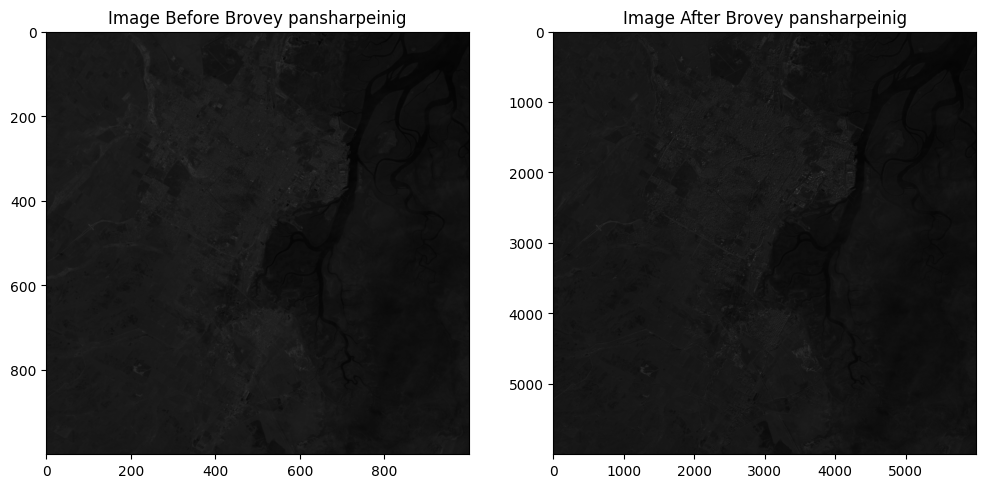

In [16]:
# Before and After Brovey pansharpening
hyp.compare_modified_imgs(im_before=hyper, im_after=Brovey_pansharpened, band=band, title_im_modified='Brovey pansharpeinig')

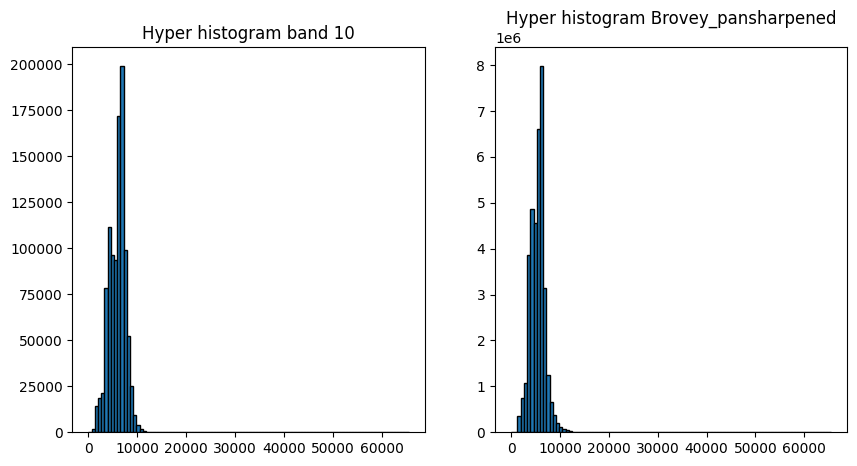

In [17]:
# Before and After Brovey pansharpening
hyp.hyper_histogram(hyp_1=hyper[:,:,band], hyp_2=Brovey_pansharpened[:,:,band], 
                    n_bins=100, title_1='band {}'.format(band), title_2='Brovey_pansharpened')

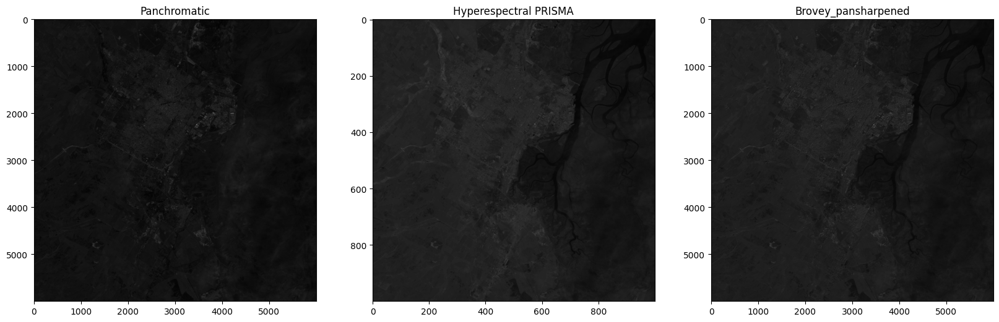

In [18]:
# Comparison between Panchromatic, hyperspectral PRISMA and Brovey_pansharpened
hyp.triple_graph(PANCHRO, hyper[:,:,band], Brovey_pansharpened[:,:,band], 
                 'Panchromatic', 'Hyperespectral PRISMA','Brovey_pansharpened')

##### Comparison between Panchromatic, Hyperspectral reescaled and Brovey_pansharpened, zoomed to an area of 500 x 500 pixels.

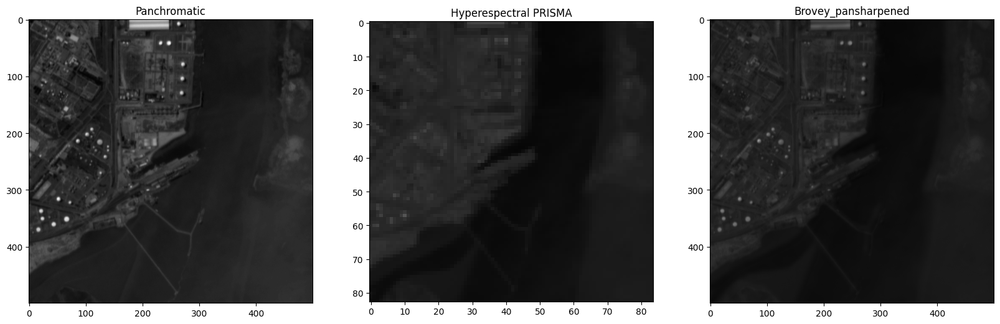

In [19]:
# Comparison between Panchromatic, Hyperspectral PRISMA and Brovey_pansharpened, zoomed to an area of 500 x 500 pixels.
coord_x = 4000
coord_y = 2000
n_pixels = 500
band = 10
hyp.triple_zoom_graph(hyp_0=PANCHRO, hyp_1=hyper[:,:,band], hyp_2=Brovey_pansharpened[:,:,band], 
                      cx=coord_x, cy=coord_y, npixels=n_pixels, 
                      title_0='Panchromatic', title_1='Hyperespectral PRISMA',title_2='Brovey_pansharpened')

Band 0


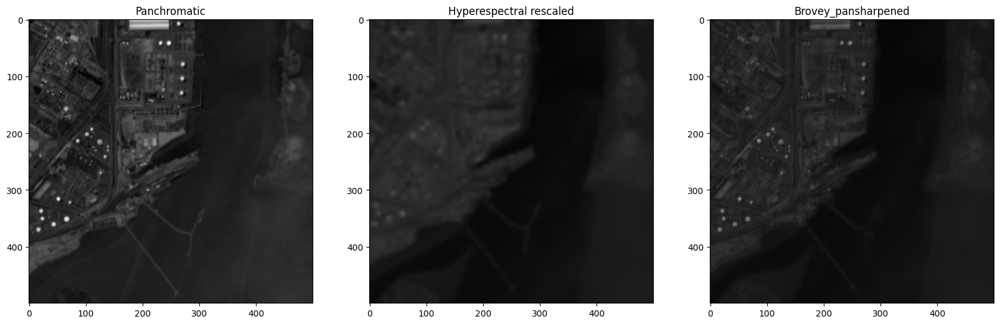

Band 10


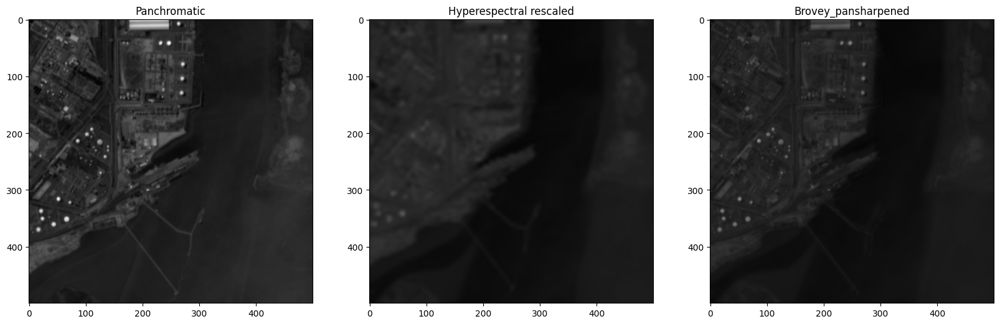

Band 20


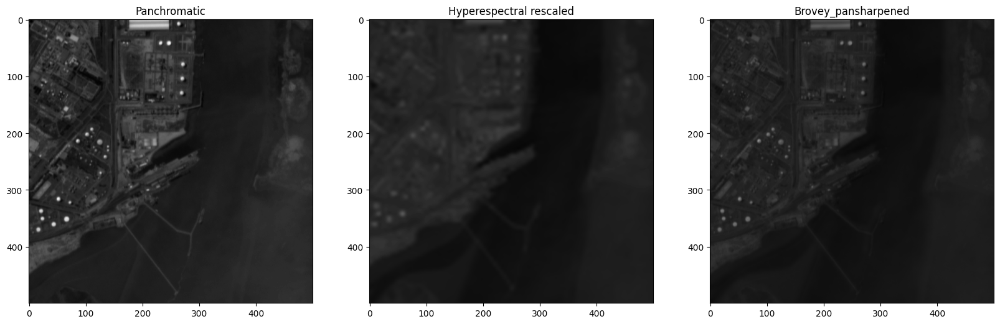

Band 30


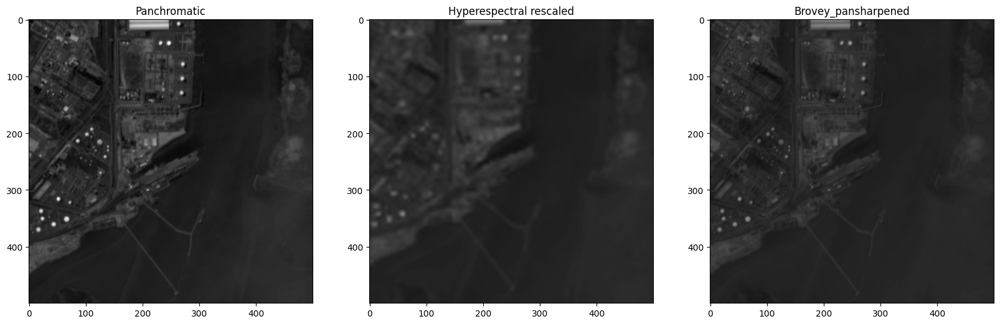

Band 40


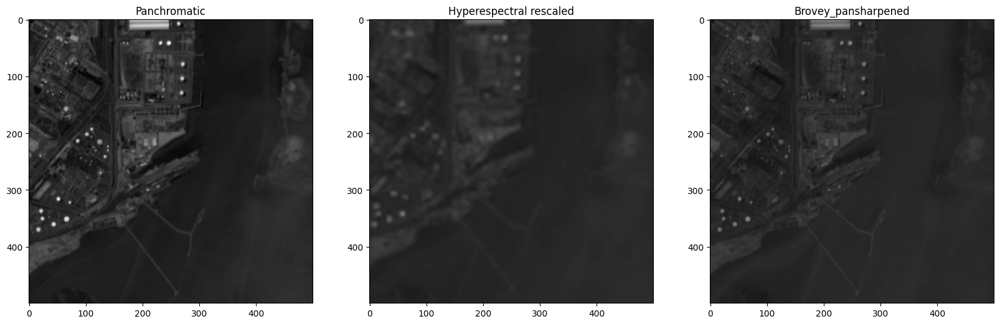

Band 50


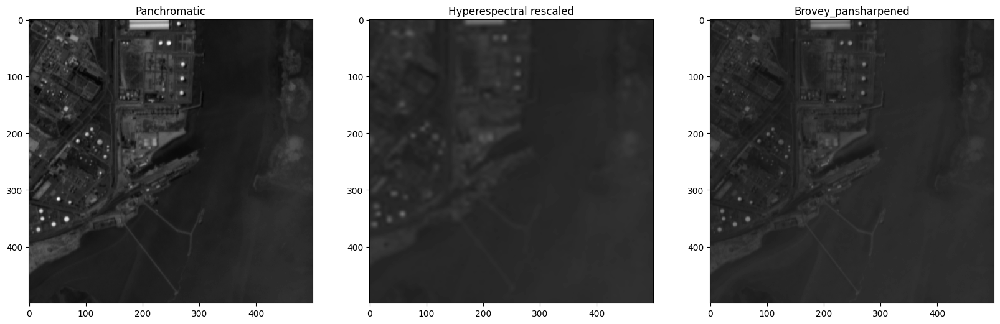

In [25]:
# Comparing several bands
band_list = range(0, 60, 10)
for n_band in band_list:
    print('Band {}'.format(n_band))
    hyp.triple_zoom_graph(hyp_0=PANCHRO, hyp_1=hyper_up[:,:,n_band], hyp_2=Brovey_pansharpened[:,:,n_band], 
                      cx=4000, cy=2000, npixels=500, 
                      title_0='Panchromatic', title_1='Hyperespectral rescaled',title_2='Brovey_pansharpened')

## Visual comparison

Band 0


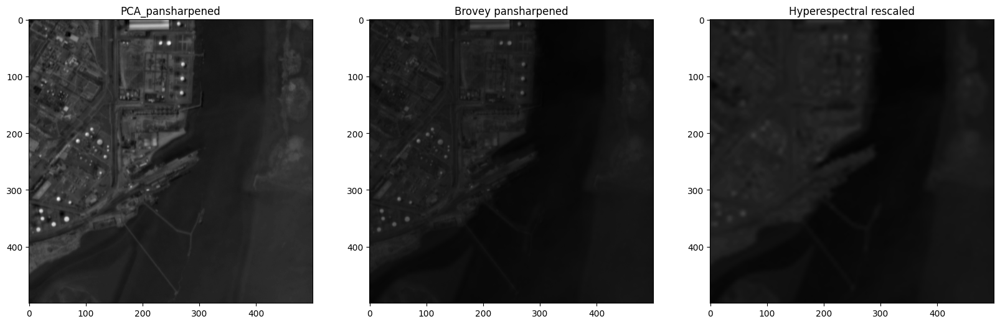

Band 10


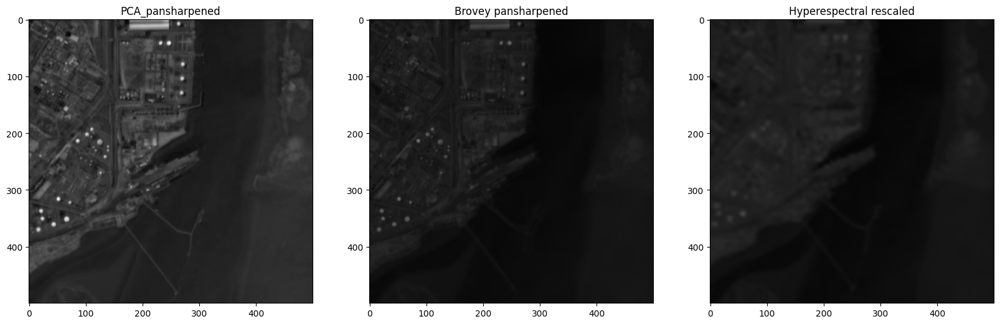

Band 20


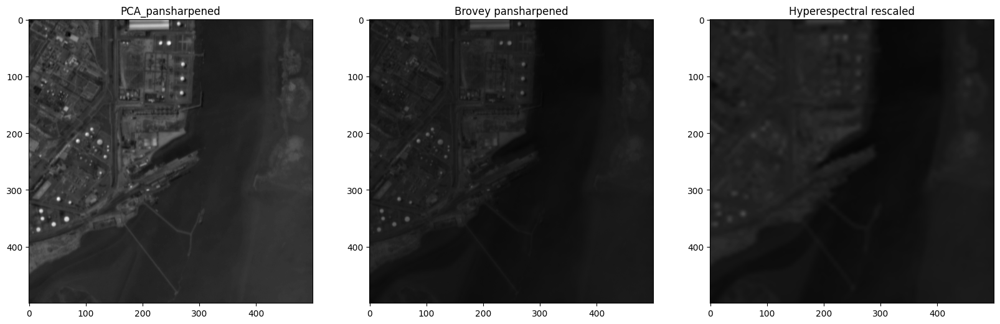

Band 30


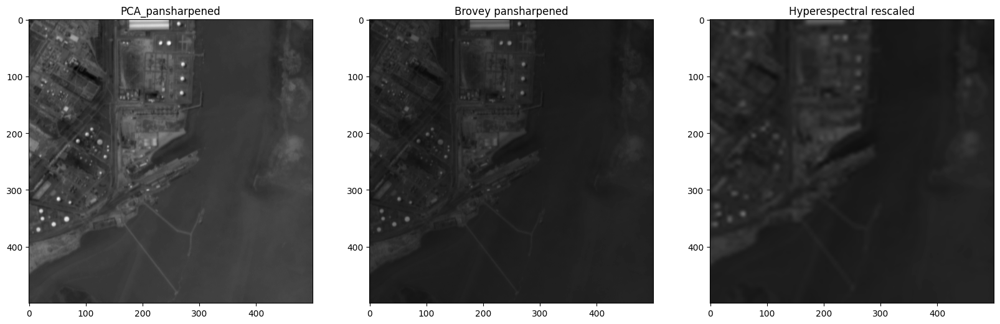

Band 40


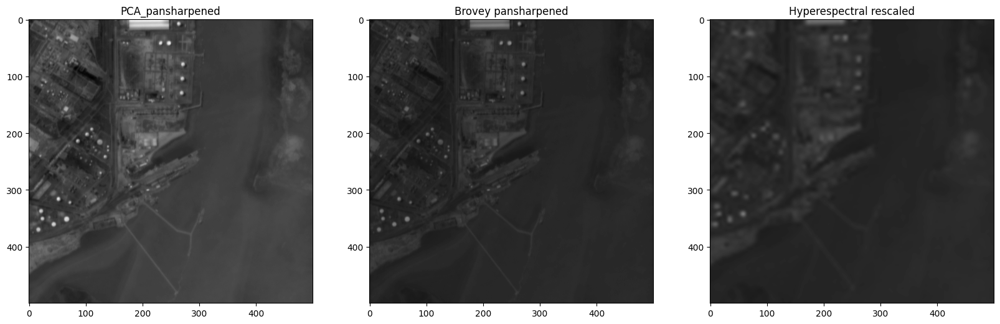

Band 50


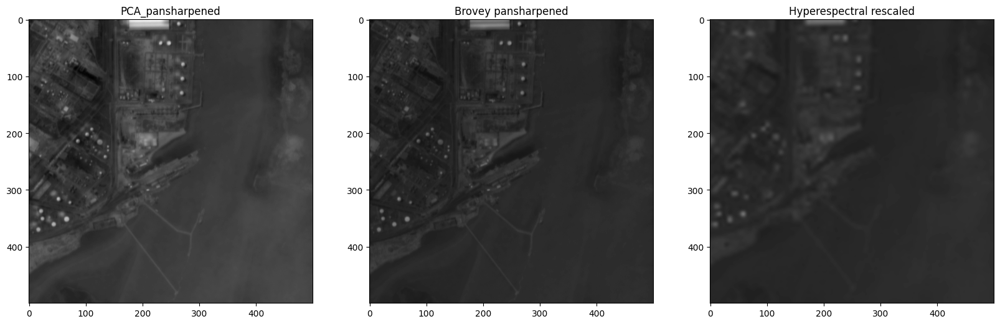

In [20]:
# Comparing several bands
band_list = range(0, 60, 10)
for n_band in band_list:
    print('Band {}'.format(n_band))
    hyp.triple_zoom_graph(hyp_0=PCA_pansharpened[:,:,n_band], hyp_1=Brovey_pansharpened[:,:,n_band], hyp_2=hyper_up[:,:,n_band], 
                      cx=4000, cy=2000, npixels=500, 
                      title_0='PCA_pansharpened', title_1='Brovey pansharpened', title_2='Hyperespectral rescaled')

## Validation metrics

#### Spatial correlation index (Q)

In [27]:
# Calculate Q index
q_PCA = hypermetrics.calculate_Q(PANCHRO, PCA_pansharpened)
q_Brovey = hypermetrics.calculate_Q(PANCHRO, Brovey_pansharpened)
print('Q PCA: {}'.format(q_PCA))
print('Q Brovey: {}'.format(q_Brovey))

Q PCA: 0.849
Q Brovey: 0.837


In order to evaluate the spectral correlation of the pansharpening methods with respect to the original hyperspectral set, the dimensions must be rescaled to the original size of the hyperspectral set.

In [21]:
# Rescaling pansharpened data to hyper shape
PCA_pan_down = hyp.rescaling(hyper, PCA_pansharpened)
Brovey_pan_down = hyp.rescaling(hyper, Brovey_pansharpened)
print('Shape PCA_down: {}'.format(PCA_pan_down.shape))
print('Shape Brovey_down: {}'.format(Brovey_pan_down.shape))

Rescaling to reference image


100%|██████████| 63/63 [01:49<00:00,  1.73s/it]


Hyper Shape before: (6000, 6000, 63), after: (1000, 1000, 63)
Rescaling to reference image


100%|██████████| 63/63 [01:51<00:00,  1.76s/it]

Hyper Shape before: (6000, 6000, 63), after: (1000, 1000, 63)
Shape PCA_down: (1000, 1000, 63)
Shape Brovey_down: (1000, 1000, 63)


#### Spectral correlation index SCC

In [22]:
# Calculate SCC metric
scc_PCA = hypermetrics.calculate_SCC(hyper, PCA_pan_down)
scc_Brovey = hypermetrics.calculate_SCC(hyper, Brovey_pan_down)
print(f"SCC PCA: {scc_PCA}")
print(f"SCC Brovey: {scc_Brovey}")

SCC PCA: 0.703
SCC Brovey: 0.702


#### Mean square error MSE

In [23]:
# Calculate MSE metric
mse_PCA = hypermetrics.calculate_MSE(hyper, PCA_pan_down)
mse_Brovey = hypermetrics.calculate_MSE(hyper, Brovey_pan_down)
print(f"MSE PCA: {mse_PCA}")
print(f"SCC Brovey: {mse_Brovey}")

MSE PCA: 27632.161
SCC Brovey: 29108.195


#### Signal to noise ratio SNR

In [24]:
# Calculate SNR metric
snr_PCA = hypermetrics.calculate_SNR(hyper, PCA_pan_down)
snr_Brovey = hypermetrics.calculate_SNR(hyper, Brovey_pan_down)
print(f"SNR PCA: {snr_PCA}")
print(f"SNR Brovey: {snr_Brovey}")

SNR PCA: 3.297
SNR Brovey: 3.44


## Histogram comparison

#### Superimposed histogram for the whole set of spectral bands

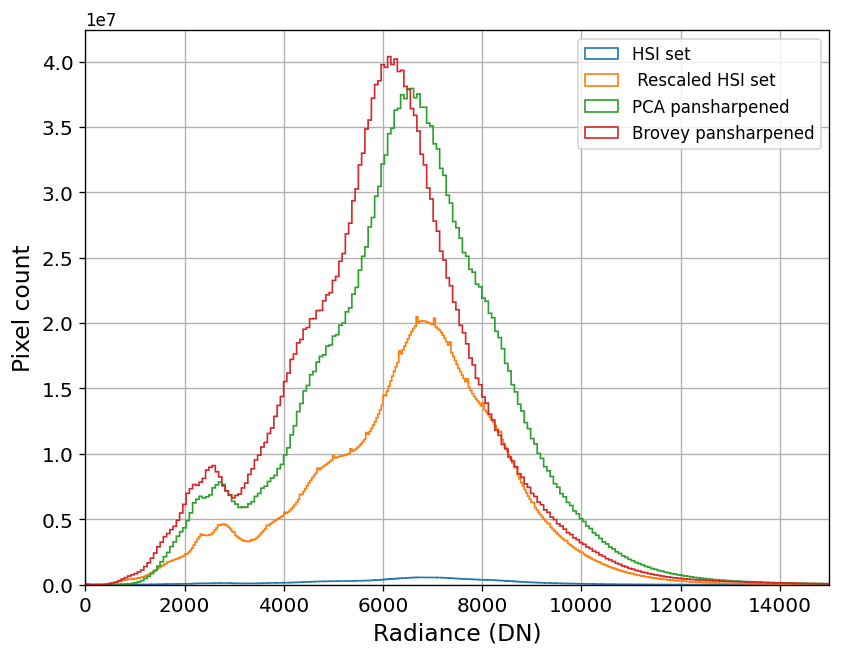

In [32]:
images = [hyper[:,:,:], hyper_up[:,:,:], PCA_pansharpened[:,:,:], Brovey_pansharpened[:,:,:]]
images_name = ['HSI set', ' Rescaled HSI set', 'PCA pansharpened', 'Brovey pansharpened']
hyp.plot_superposed_histograms(images, images_name, normalised=False, num_bins=1000)

#### Superimposed normalised histogram for the whole set of spectral bands

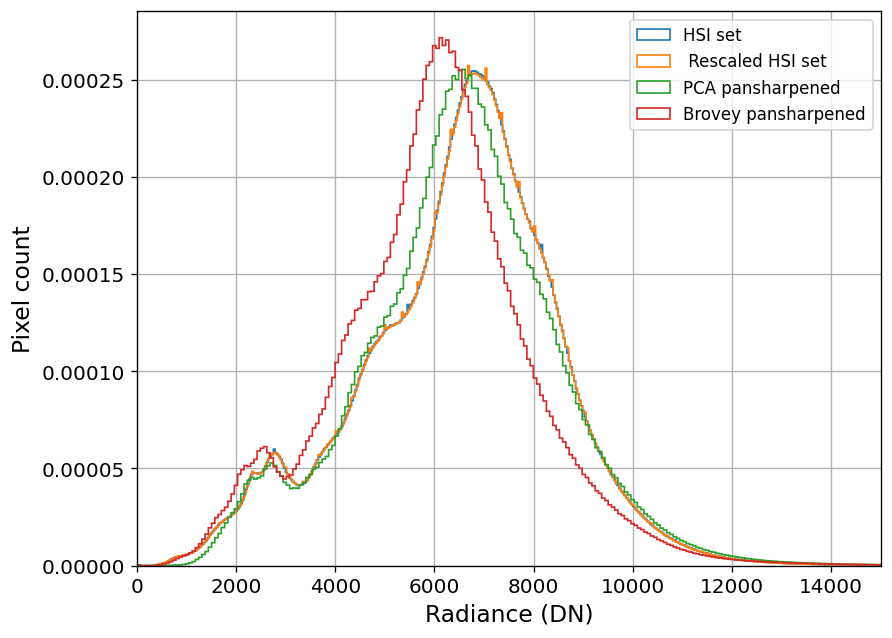

In [33]:
images = [hyper[:,:,:], hyper_up[:,:,:], PCA_pansharpened[:,:,:], Brovey_pansharpened[:,:,:]]
images_name = ['HSI set', ' Rescaled HSI set', 'PCA pansharpened', 'Brovey pansharpened']
hyp.plot_superposed_histograms(images, images_name, normalised=True, num_bins=1000)

#### Superimposed normalised histogram for a list of spectral bands

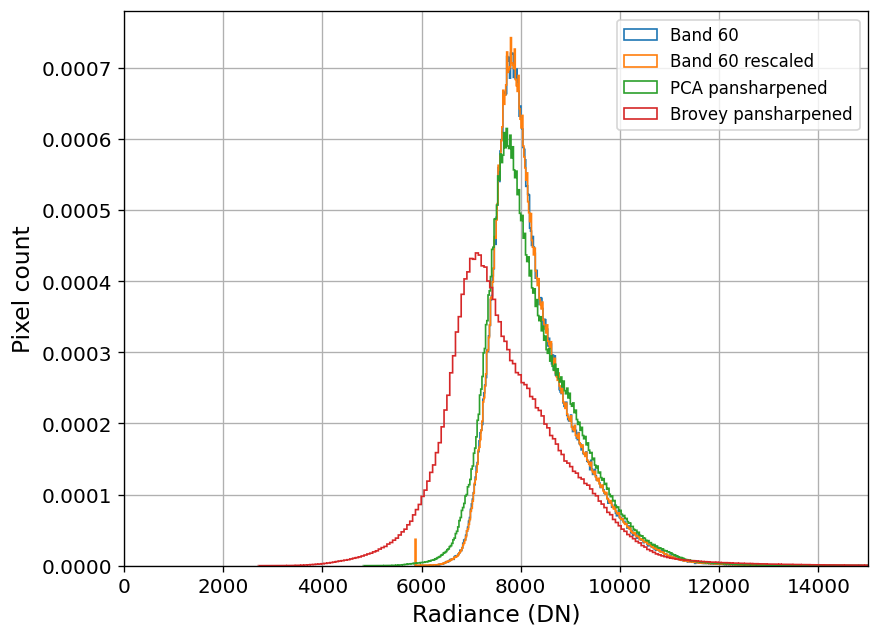

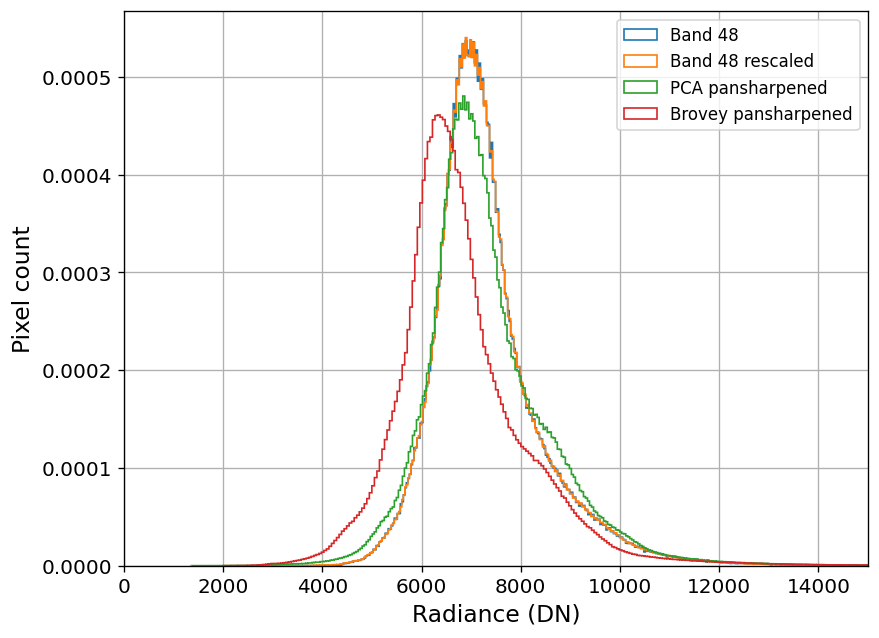

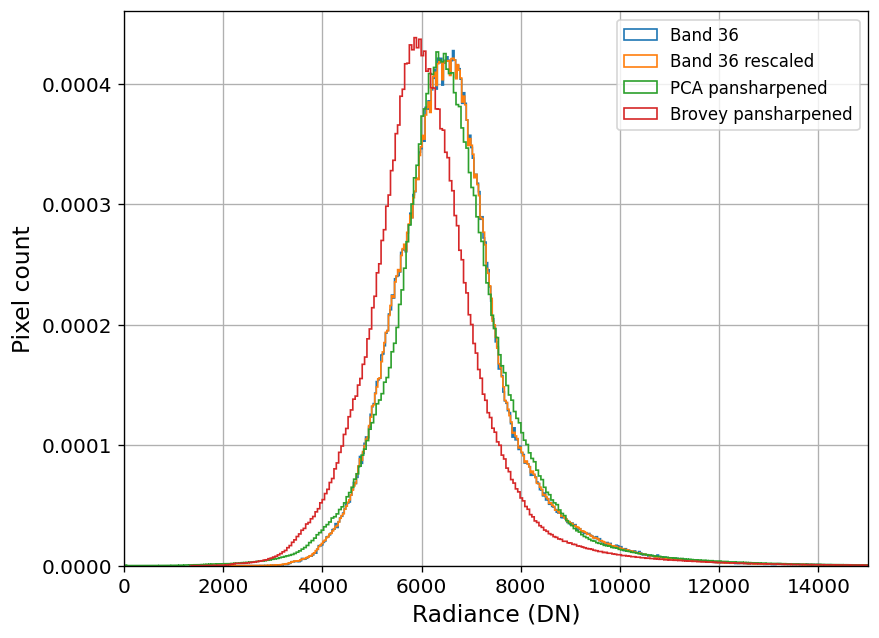

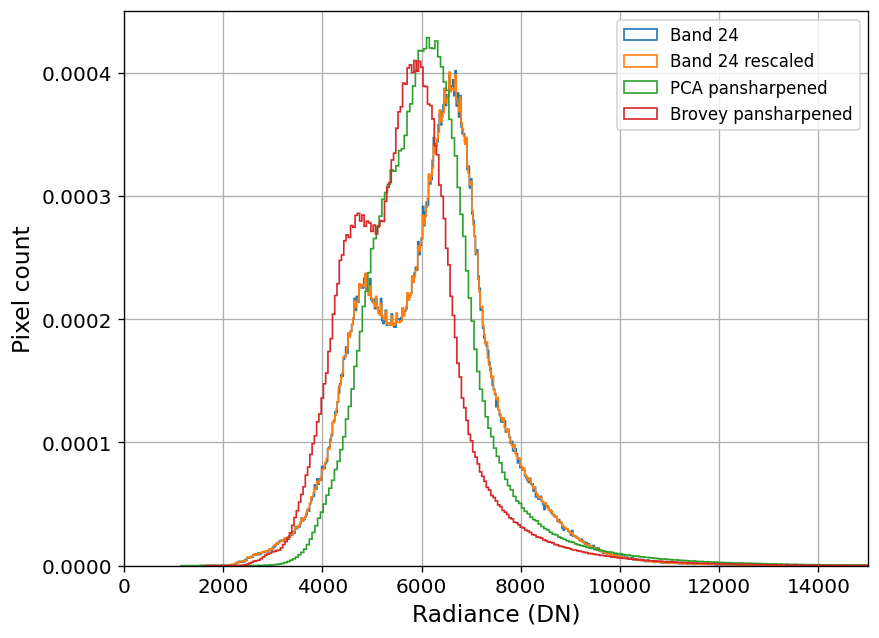

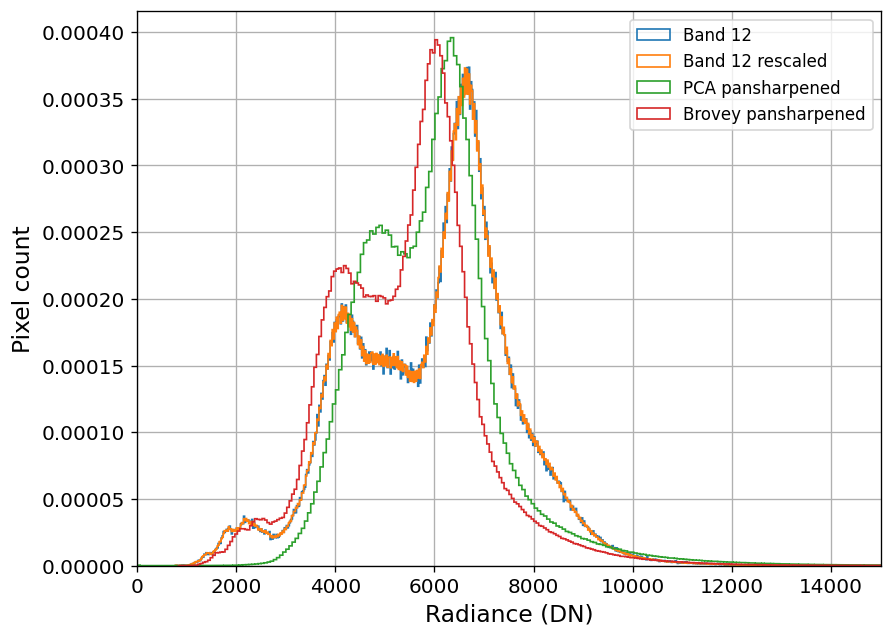

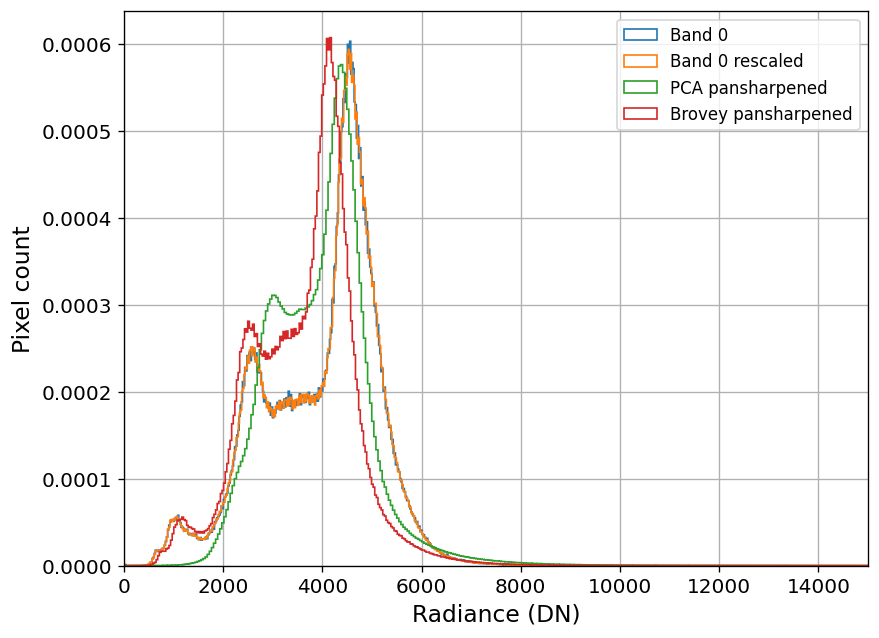

In [25]:
band_list = [0, 12, 24, 36, 48, 60][::-1]
for band in band_list:
    images = [hyper[:,:,band], hyper_up[:,:,band], PCA_pansharpened[:,:,band], Brovey_pansharpened[:,:,band]]
    images_name = ['Band {}'.format(band), 'Band {} rescaled'.format(band), 'PCA pansharpened', 'Brovey pansharpened']
    hyp.plot_superposed_histograms(images, images_name, normalised=True, num_bins=1000)